# Who-follow-who graph

In this notebooke the graph based on follows on Twitter is found

## Package import

All needed packages are imported below

In [102]:
import pandas as pd
import numpy as np
import networkx as nx 
import pickle
import itertools
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from svgpathtools import svg2paths
from svgpath2mpl import parse_path
import matplotlib as mpl
from operator import itemgetter
import seaborn as sns
sns.set()
from fa2 import ForceAtlas2

## Get data

First we load the needed data. The three loaded data sets are:

1) Handle data which includes the twitter handles and the following attributies:
- State
- Party (note we change from abbreviation to full Party name)
- Type (senator, representative or potus)
- Name

2) Following adjacency matrix. The directer adjancency matrix of who follows who on Twitter

3) Dictionary of the total number of following per twitter user.

In [2]:
# Load data on all congress-members
Handle_data = pd.read_csv('../Data/Processed/Twitter_Handles.csv', index_col=0).set_index('Twitter')
Handle_data['Party'] = Handle_data['Party'].map({'R': 'Republican', 'D': 'Democrat', 'I': 'Independent', 'L': 'Libertarian'})

# Get Adjajency matrix
Follow_df = pd.read_csv('../Data/Processed/Follow_df.csv', index_col=0)

# Get dictionary of the total number of following for all persons in the data st
with open('../Data/Processed/No_follow_dict.pickle', 'rb') as handle:
    No_follow_dict = pickle.load(handle)

Now the graph is created as a directed graph from the adjancency matrix. The Twitter-handles are also set as the node names.

In [3]:
# Create graph
G = nx.from_numpy_matrix(Follow_df.values, create_using=nx.DiGraph())

# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(Follow_df.columns)}
G = nx.relabel_nodes(G, label_mapping)

## Attributes and isolates

The `Handle_data`as well as the `No_follow_dict` contains info for each person via their Twitter handle. These can be seen as attributes why they are added as node attributes for the graph. The same is the case for the total number of following.

In [4]:
# Add atributes
for node in G.nodes:
    # Other info from data set
    G.nodes[node].update(Handle_data.loc[node].to_dict())

    # Number of total following 
    G.nodes[node].update({"Total_follow": No_follow_dict[node]})

In the graph nodes can be isoltaed if they are not following anyone else and do not have any followers from the data set. There can be multiple reasons for this. Maybe there was an error in the data and Twitter handlers corresponds to another person. If can also be the case that it is a person from the 115$^{\text{th}}$ congress who were not reelected - afterwards they might closed their Twitter and their handle has then be taken by someone else. 

The isolated nodes are not deemed relevant for this graph why they are removed below:

In [5]:
# Get isolates
nodes_to_remove = list(nx.isolates(G))

# Remove isolates
G.remove_nodes_from(nodes_to_remove)

# Show how many are removed
print(f"{len(nodes_to_remove)} nodes removed as they are isolates")

7 nodes removed as they are isolates


As it can be seen 7 nodes are removed. This is not a significant figure why this is not something that should be a problem and wor is continued on the resulting graph.

## Basic stats of the graph

Let's first have a look at the total nodes, which is done with the `.nodes` method from Networkx.

In [6]:
# Nodes
print(f'The graph has {len(G.nodes)} nodes in total')

The graph has 610 nodes in total


So there is a total of 610 nodes. Let's investigate those a bit closer based on the available attributes.

### Party distribution

A natural way to start is the distribution of parties from the 610 nodes. They are calculated below and plotted as a bar plot. The party colors are used with gray from independnets.

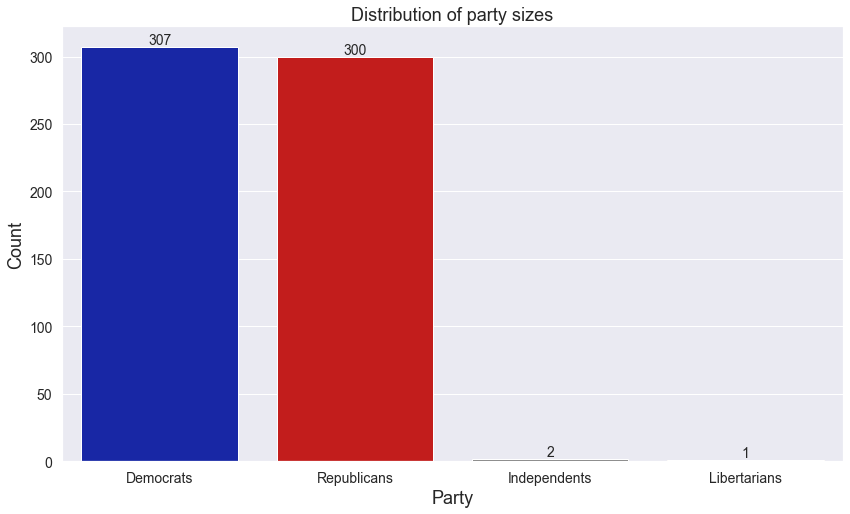

In [7]:
# Distribution of parties
party_dist = pd.Series([Party for Handle, Party in G.nodes(data='Party')]).value_counts()

# Dictionary with parties and colors
color_dict = {"Democrat": "#0015BC", "Republican": "#DE0100", 'Independent': "tab:gray", 'Libertarian': "#FED105"}

# Bar plot
plt.figure(figsize = (14,8))
sns.barplot(
    x = [party+"s" for party in party_dist.index], 
    y = party_dist.values, 
    palette = [color_dict[party] for party in party_dist.index]
)

# Add counts
for x, count in enumerate(party_dist.values):
    plt.text(x, count + 2 , count, fontsize=14, ha = 'center')

# Other paramenters
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel("Party", fontsize = 18)
plt.ylabel("Count", fontsize = 18)
plt.title("Distribution of party sizes", fontsize = 18)
plt.show()

As the United States' in practise have a two-party system it is not surpring to see all cognress members with Twitter except 3 belonging to the Democrats or Republicans. Let's just have a quick look at the 3 exceptions:

In [8]:
Handle_data[~Handle_data.Party.isin(['Republican', 'Democrat'])]

,State,Party,Type,Name
Twitter,,,,
SenAngusKing,ME,Independent,Senator,Angus King
justinamash,MI,Libertarian,Representative,Justin Amash
SenSanders,VT,Independent,Senator,Bernie Sanders


An interestign name to notice is Bernie Sanders who has run in the primary presidential election for the Democrats even though he officially is an independent senator for Vermount. 

### Type distribution

Another interesting aggregation is based on the type (i.e. representitative, senator or Presidnet (POTUS)). Below tre numbers are aggregated together with the party so the distribution can be show:

Party           Democrat  Independent  Libertarian  Republican  Total
Type                                                                 
POTUS                0.0          0.0          0.0         1.0    1.0
Representative     259.0          0.0          1.0       245.0  505.0
Senator             51.0          2.0          0.0        58.0  111.0
Total              310.0          2.0          1.0       304.0  617.0




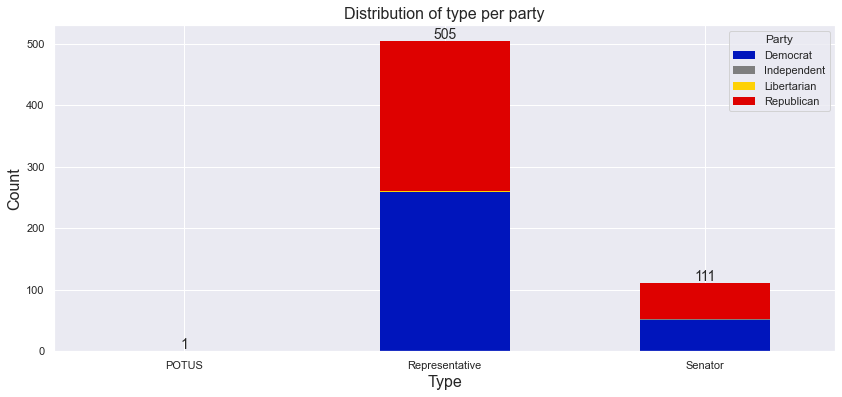

In [9]:
# Count the number of types per party
Type_Party_Count = Handle_data[['Party', 'Type']].reset_index().pivot_table(columns='Party',index='Type',aggfunc = 'count').fillna(0)
Type_Party_Count.columns = Type_Party_Count.columns.droplevel()


# Make copy to print
Type_Party_Count_print = Type_Party_Count.copy()
#Total sum per column: 
Type_Party_Count_print.loc['Total',:]= Type_Party_Count_print.sum(axis=0)
#Total sum per row: 
Type_Party_Count_print.loc[:,'Total'] = Type_Party_Count_print.sum(axis=1)

# Print results numerically
print(Type_Party_Count_print)
print("\n")

# Show results graphically
Type_Party_Count.plot(
    kind='bar',
    stacked=True,figsize=(14,6), 
    color = color_dict,
    linewidth = 0
)

# Add count
for x, count in enumerate(Type_Party_Count.sum(axis=1).values):
    plt.text(x, count + 3 , int(count), fontsize=14, ha = 'center')

# Set parameters
plt.title("Distribution of type per party", fontsize = 16)
plt.xlabel("Type", fontsize = 16)
plt.xticks(rotation=0)
plt.ylabel("Count", fontsize = 16)
plt.show()

Immediatly it becomes clear that representitatives clearly dominates the dataset with 505. Senators are only 111 while there naturally only is one president, Donald J. Trump. Between the 115$^{\text{th}}$ and 116$^{\text{th}}$ congress all 435 seats in the house of representitatives were up for election while only around a third of the 100 seats in the Senate were up for election. Moreover United States overseas territories also gets seats in the house of representitatives (though without voting power). With these reasons it makes sense that representitatives are so dominant.

From the plot the stacked element also clearly illustrates that the Democrats and Repuliblicans are so large - but also fairly equal in terms of sizes.

### Distribution of States

The last attirbute to look at is the states. Let's first look at the number of different states in the dataset


In [10]:
print(f'There are {Handle_data.State.nunique()} unique states in the data.')

There are 55 unique states in the data.


So there are 55. This is more than the 50 *usual* states that wer hear about. This is because American Samoa, District of Columbia, Northern Mariana Islands, Puerto Rico and Virgin Islands also gets seats in the House of Representiatives. They do not have voting 
power but they can participate in debates. Let's see the number of congress memebers in each state in the data set (please note that the presentident does not a have a state associated with him.)

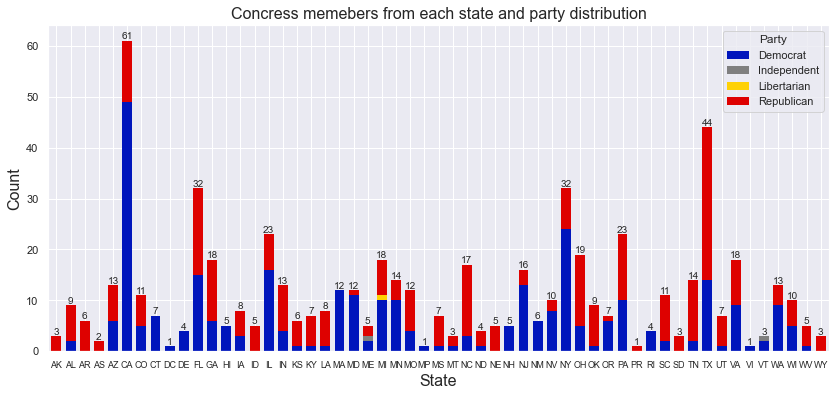

In [11]:
# Count the number of types per party
State_Party_Count = Handle_data[['State', 'Party']].reset_index().pivot_table(columns='Party',index='State',aggfunc = 'count').fillna(0)
State_Party_Count.columns = State_Party_Count.columns.droplevel()


# Show results graphically
State_Party_Count.plot(
    kind='bar',
    stacked=True,figsize=(14,6), 
    color = color_dict,
    width= 0.7,
    linewidth = 0
)

# Add count
for x, count in enumerate(State_Party_Count.sum(axis=1).values):
    plt.text(x, count + 0.3 , int(count), fontsize=10, ha = 'center')

# Set parameters
plt.title("Concress memebers from each state and party distribution", fontsize = 16)
plt.xlabel("State", fontsize = 16)
plt.xticks(rotation=0, fontsize = 9)
plt.ylabel("Count", fontsize = 16)
plt.show()

Above the distribution is seen. Remember that the data is from two congresses so reelected politicians will only count as one - thus it does not fully illustrate the political landscabe. But the plot gives the exaxct distribution of the dataset that is used in the project. It also becomes very apparent how the sizes (based on memebers of congress) varies between states. California is the largest by some distance down to Texas. Then there is an additional large jump to Florida and New York with 32 each - and additional large jump is then down to Illinois and Pennsylvania with 23. Many states are found in the band in with 11-14 members. The full distribution as a histogram is found below:

<Figure size 1152x576 with 0 Axes>

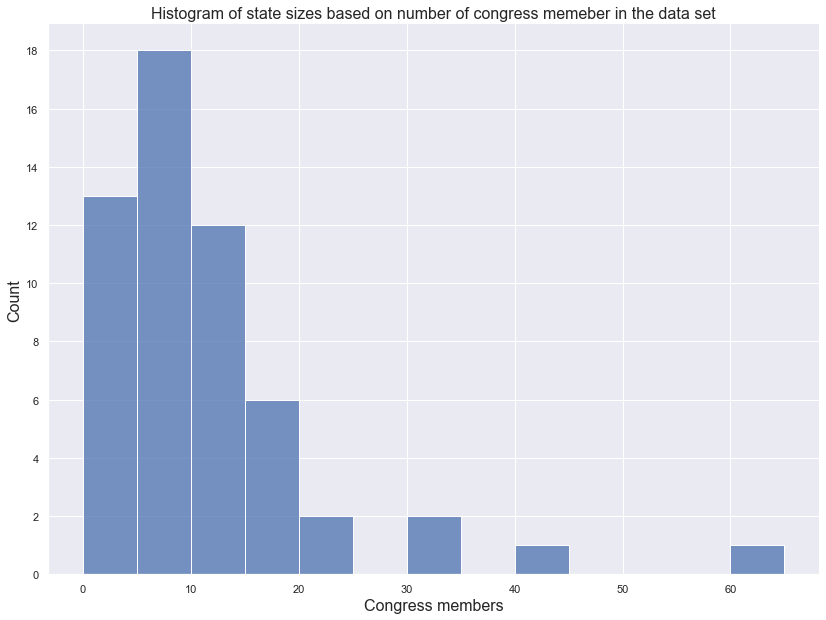

In [12]:
plt.figure(figsize = (16,8))
sns.displot(State_Party_Count.sum(axis=1).values, bins = range(0,70,5), height=8.27, aspect=11.7/8.27)
plt.title("Histogram of state sizes based on number of congress memeber in the data set", fontsize = 16)
plt.xlabel("Congress members", fontsize = 16)
plt.ylabel("Count", fontsize = 16)
plt.yticks(range(0,20,2))
plt.show()

From this histogram it really becomes apparent how most state sizes are below 15 why California and Texas are more *edge cases*. This sizes are relevant to keep in mind if community detection will be done based states.

## Edges

Let's move onto investigating the edges in the network. As a reminder, an edge from node A til node B means that the politician corresponding to node A follows the politician from node B. The total number of follows within the network corresponds to the total number of edges which is:

In [37]:
# Edges
print(f'There are a total of {len(G.edges)} edges in the data set.')

There are a total of 83254 edges in the data set.


So with that many nodes the network can definitly be consideres *dense* as each politician follows $83254/610 \approx 136$ of the other politicians corresponding to around 22%. Following this info it will be investigated if patterns can be seen in who follows who.

### Follows by party

First let's see if there is some patterns based on party members. This will be done by aggregating the number of follows on a party-level which then will result in a 4x4-matrix. It is generated and shown below:

In [40]:
# Who follows who
Who_follow_who_party = pd.DataFrame(data = 0, index = Handle_data.Party.unique(), columns = Handle_data.Party.unique())

# Populate dataframe
for edge in list(G.edges):
   
    Who_follow_who_party.loc[
        Handle_data.loc[edge[0], 'Party'],
        Handle_data.loc[edge[1], 'Party']
        ] += 1

# Show result
Who_follow_who_party

,Republican,Democrat,Independent,Libertarian
Republican,29176,5561,73,139
Democrat,6771,40511,258,61
Independent,53,113,2,0
Libertarian,265,269,2,0


The first thing one would probably notice by looking at the Republicans and Democrats is that they have a very clear bias towards following politicians from their own party. Allready a clear indictation of the polarisation. Looking at the two independent senators they seem to have bais towards to Democrats while the sole Libetarian seems very neutral. 

### By type

The same analysis will be carried out on the type level with the results also shown below:

In [41]:
# Who follows who
Who_follow_who_type = pd.DataFrame(data = 0, index = Handle_data.Type.unique(), columns = Handle_data.Type.unique())

# Populate dataframe
for edge in list(G.edges):
   
    Who_follow_who_type.loc[
        Handle_data.loc[edge[0], 'Type'],
        Handle_data.loc[edge[1], 'Type']
        ] += 1

# Show result
Who_follow_who_type

,Representative,Senator,POTUS
Representative,62220,10040,265
Senator,4102,6576,49
POTUS,2,0,0


Here it is very interesting to see that the senators have a clear bias towards following other senators. Even though there are around 5 times more representitative there are 1.5 follows more then other senators than representitatives. For the representitatives it seems to be more inline with the actual distribution. For both representitatives and the senators around half of the follows the President - in return he only follows 2 representitatives.

## Out- and in degree

Based on the out and in degree fom the network it can be determined who follows the most other politicians and who has the most follows. First the number of the most followers will be found as the in-degree, where the top 10 will be extraceted. Before printing the results the Twitter handles will be converted to their actual names whioch should be more interpretable - at least if one follows American Politics.

In [45]:
# Get top 10 in
top5_in = dict(sorted(dict(G.in_degree).items(), key = itemgetter(1), reverse = True)[:10])

# Get them in terms of name instead of twitter handle
top5_in = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_in.items()}
top5_in

{'Nancy Pelosi': 335,
 'Donald J. Trump': 314,
 'Kevin McCarthy': 313,
 'Steny H. Hoyer': 290,
 'John Lewis': 262,
 'Adam Schiff': 259,
 'Kyrsten Sinema': 256,
 'Chuck Schumer': 256,
 'Steve Scalise': 250,
 'Eric Swalwell': 247}

So the top results are not surpring and it is probably some names that most people recognize - just to go through the top five:

1) Nancy Pelosi is the speaker in the House of Representatives

2) Donald J. Trump is POTUS

3) Kenvin McCarthy serves as the Republican leader in the House of Representatives (both majority- and minority leader in the data set used.)

4) Steny H. Hoyer currently serves as the majority leader in the House of Representatives.

5) John Lewis served for 33 years in the House of Representatives untill his death in July of 2020 and has thought for civil rights and served in the leadership of the Democrats in the House.


After the top four it is also seen that the the amount of follows (from politicians) are more constant with smaller *jumps*.
Let's move on to looking at the out-degree corresponding to the number they follow:

In [46]:
# Get top 10 out
top5_out = dict(sorted(dict(G.out_degree).items(), key = itemgetter(1), reverse = True)[:10])

# Get them in terms of name
top5_out = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_out.items()}
top5_out

{'Justin Amash': 536,
 'Matt Cartwright': 485,
 'Mark Pocan': 482,
 'Jared Golden': 471,
 'Trent Kelly': 459,
 'Ted Lieu': 433,
 'Kyrsten Sinema': 426,
 'Glenn Thompson': 426,
 'Dean Heller': 423,
 'Alan Lowenthal': 413}

These names are not as recognizable as before but some slight info about the top 5 can be seen below since they were investigataed:

1) Justin Amash is the only Libitarian in the data set where little bias towards either major party was found earlier.

2) Matt Cartwright represents the Democrats in the House of Representatives and has done so since 2013.

3) Marc Pocan is also a Democrat who assumed office in the House of Representatives in 2013.

4) Jared Golden is a US veteran and Democrat in the House of Representatives.

5) Trent Kelly represents the Republicans in the House of Representatives. 

So in general it is hard to find a clear pattern except that these politicans seem to value getting lots of tweets from their colleagues in their feed.

Another possibility could be these politicians in general just follows many on Twitter. This is investigated below by looking at this correlation - it can be found below:

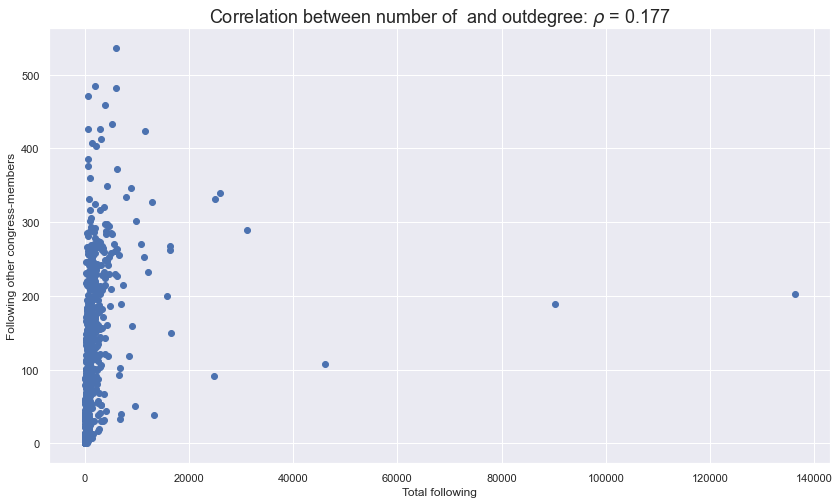

In [18]:
# Lists of length and out degree
Fol = [G.nodes[node]['Total_follow'] for node in G.nodes]
Od = [v for k,v in G.out_degree]

# Correlation coefficient
rho = np.corrcoef(Fol, Od)[1,0]

# Plot
plt.figure(figsize = (14,8))
plt.scatter(Fol,Od)
plt.title(fr'Correlation between number of  and outdegree: $\rho$ = {rho:.3f}', fontsize = 18)
plt.ylabel('Following other congress-members')
plt.xlabel('Total following')
plt.show()

The correlation look fairly low but there are also a handfull of politicians who follows extremely many. Below those with more than 20.000 following are filtered out to see how much they actual impact the results. It can be seen below:

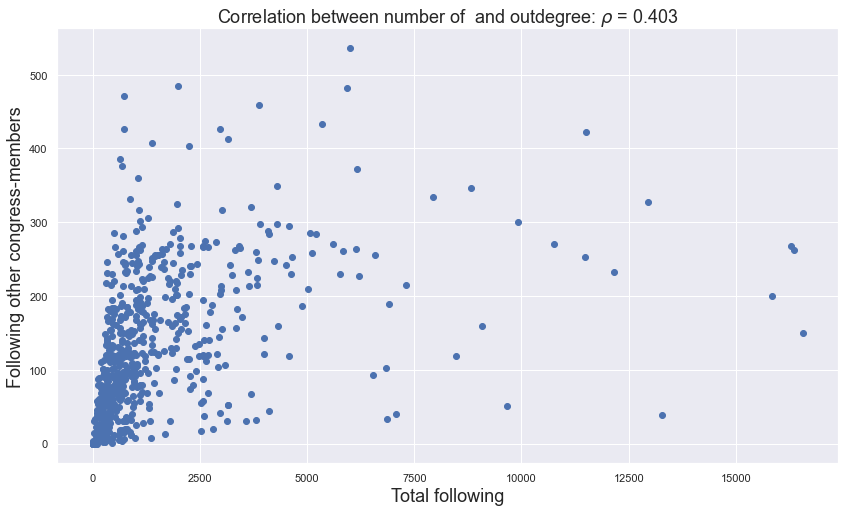

In [72]:
# New lists of length and out degree
Fol = [G.nodes[node]['Total_follow'] for node in G.nodes if G.nodes[node]['Total_follow'] <= 20000]
Od = [v for k,v in G.out_degree if G.nodes[k]['Total_follow'] <= 20000]

# Correlation coefficient
rho = np.corrcoef(Fol, Od)[1,0]

# Plot
plt.figure(figsize = (14,8))
plt.scatter(Fol,Od)
plt.title(fr'Correlation between number of  and outdegree: $\rho$ = {rho:.3f}', fontsize = 18)
plt.xlabel('Total following', fontsize = 18)
plt.ylabel('Following other congress-members', fontsize = 18)
plt.show()

So by filtering out these few nodes the correlation now reaches 40% is clearly significant. There are though still many other factors that must account for the remaining variance. Some of it could be due to the polarisation where politicians pretty much mainly follows other politicians from their own party.

### Histograms of the in and out-degree

So far we have only looked at the top 10 and the numbers of following as a function of total following. Let's investigate the in- and out degree distribution as histograms which is done below:

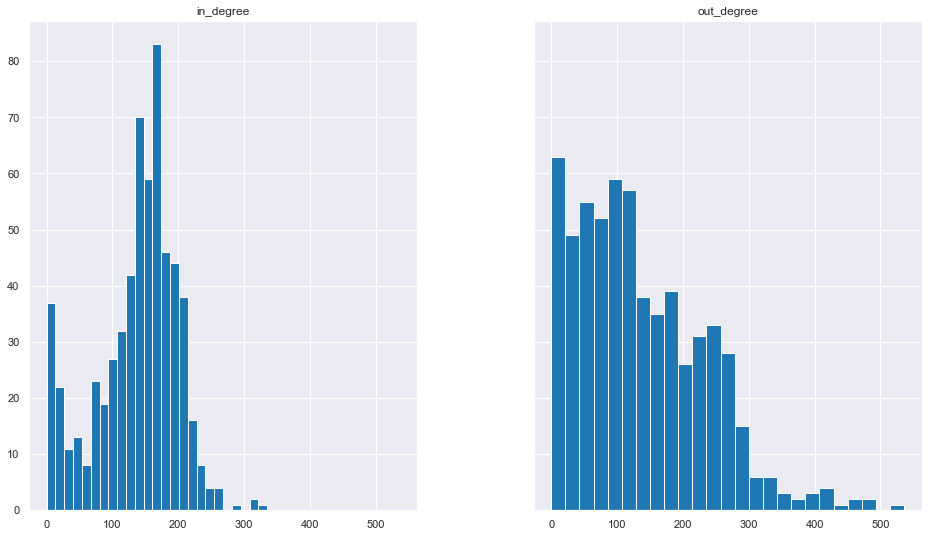

In [79]:
# Store in and out degree in datafram
degree_distribution = pd.DataFrame({
    'in_degree' : np.array(list(dict(G.in_degree).values())),
    'out_degree' : np.array(list(dict(G.out_degree).values()))
})

# Illustrate results
hist = degree_distribution[['in_degree', 'out_degree']].hist(bins=25, figsize=(16,9), color = "tab:blue", sharex = True, sharey = True)
plt.savefig('../figures/Degree_distribution.jpg', bbox_inches = 'tight', pad_inches = 0.2)

Very interesting (notice the shared axis)! It is clearly not the same distribution but stille it is not as differenct when comparing to the *Super Hero Network* that was used in class. This means that this politician-network is much more equal and there are fewer *famous* nodes. And almost all nodes seem to have at least a handfull of followers. There seem to be a spike in the first bin why it is quickly checked how many zeros there are in the in- and out degree:

In [80]:
# How many are 0?
print(f'There are {len([v for (k,v) in G.out_degree if v == 0])} who follows no one from the data set, and {len([v for (k,v) in G.in_degree if v == 0])} with no followers in the dataset.')


There are 8 who follows no one from the data set, and 7 with no followers in the dataset.


So not really anythin out of the ordinary. As the distributions are not to far from each other it is interesting to investigate th number of folliwng versus followers - maybe some of the difference is a result of how active politicians are at Twitter. This will mean that a high number of follower are correlated with a high number of following which is checked below:

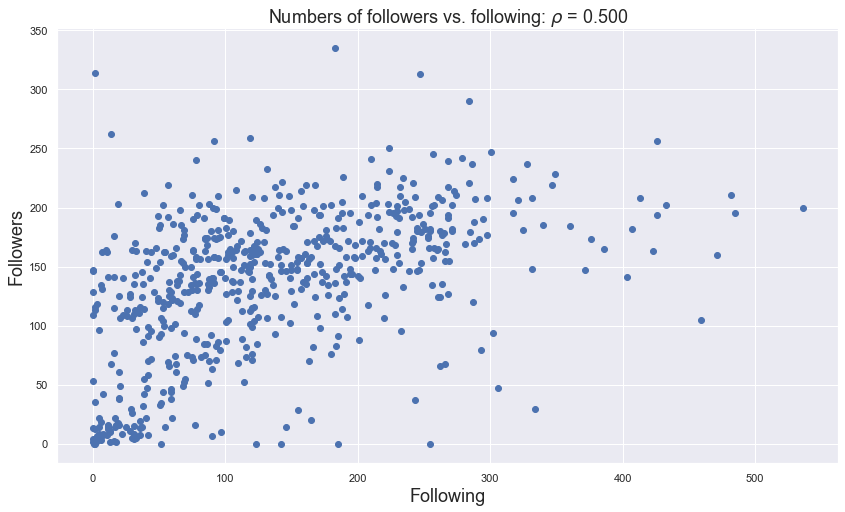

In [82]:
# Calculate correlation coefficient
rho = np.corrcoef(degree_distribution.out_degree,degree_distribution.in_degree)[1,0]

# Show plot
plt.figure(figsize = (14,8))
plt.scatter(degree_distribution.out_degree,degree_distribution.in_degree)
plt.title(fr'Numbers of followers vs. following: $\rho$ = {rho:.3f}', fontsize = 18)
plt.xlabel('Following', fontsize = 18)
plt.ylabel('Followers', fontsize = 18)
plt.show()

So it looks like there is some clear correlation - especially in the lower left part of the graph which could indicate some inactive users.



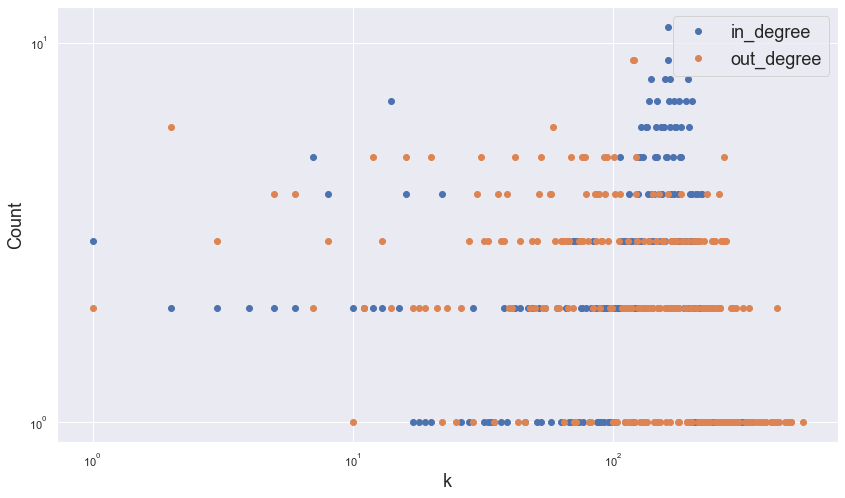

In [81]:
# Initialize plot
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize = (14,8))
degree_distribution['in_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
degree_distribution['out_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel("k", fontsize = 18)
ax1.set_ylabel("Count", fontsize = 18)
ax1.legend(fontsize = 18)
plt.show()

### Statistics on the in- and out-degree

Last point before visualization is some basic statistics on the in and out-degree to see if it aligns with the observations abve. For this a function have been made that calculate the statistics from Pandas' describe together with the mode. It is carried out below:

In [98]:
def Calc_statistic(Graph):
    # Make data
    ID = np.array([v for k,v in Graph.in_degree])
    OD = np.array([v for k,v in Graph.out_degree])
    data = pd.DataFrame(data = np.vstack((ID, OD)).T, columns = ["In", "Out"])
    
    # Get statistics from Pandas' describe
    des = data.describe()

    # Get modes
    modes = data.mode().rename(index={0: "mode"}).iloc[0]

    # Return combined data
    return des.append(modes)

Calc_statistic(G)

,In,Out
count,610.000000,610.000000
mean,136.481967,136.481967
std,62.209196,97.755906
min,0.000000,0.000000
25%,106.000000,59.000000
50%,148.000000,119.000000
75%,178.750000,201.000000
max,335.000000,536.000000
mode,162.000000,119.000000


So the story is the same. The out-degree varies much more than the in-degree. To interpret this it corresponds to the fact that the varying part is how many a politician follows while they can be fairly certain to have a good handfull of followers from the Congress if they use Twitter. 

# Visualisation of the Graph

Now we get to the exiting part - visualising the graph. For illustrating puporses the graph is converted to a binary undirected graph where it requires mutual follows between two politicians for a link to appear. This version of the graph is created below:

In [214]:
# Initialize graph
UG = nx.Graph()

# Add nodes from directed graph
UG.add_nodes_from(G.nodes(data=True))

# Add edjes
UG_edge_list = [(i,j) for (i,j) in list(itertools.combinations(G.nodes, 2)) if (i,j) in G.edges and (j,i) in G.edges]
UG.add_edges_from(UG_edge_list)

print(f'{len(UG.edges)} edges remain.')

24882 edges remain.


As it can be seen 24882 edges remains. This corresponds to $24882\cdot 2 = 49764$ edges in the original graph so this tells that in the majority of cases in the directed graph links are *mutual*. Still, many links have been removed which could hace created new isolates. Those are removed below:

In [223]:
isolates = list(nx.isolates(UG))
UG.remove_nodes_from(isolates)
print(f'Removed {len(G.nodes)-len(UG.nodes)} nodes. {len(UG.nodes)} nodes remain.')

Removed 21 nodes. 589 nodes remain.


## Options for the graph



In [207]:
# Node size
tmpG = G.to_undirected()
tmpG.remove_nodes_from(isolates)
node_size = [Degree for Key, Degree in tmpG.degree]

In [208]:
# Node colors
node_color = [color_dict[v] for k,v in nx.get_node_attributes(UG,'Party').items()]

In [209]:
# Edge colors
def color_edge(Party1, Party2):
    # Orange between two republican
    if Party1 == 'Republican' and Party2 == 'Republican':
        color = 'tab:orange'
    
    # Cyan between two democrates
    elif Party1 == 'Democrat' and Party2 == 'Democrat':
        color = 'tab:cyan'
    
    # Gray when connected to an independent
    elif Party1 == 'Independent' or Party2 == 'Independent':
        color = "tab:gray"

    # Yellow when connected to a liberal
    elif Party1 == 'Libertarian' or Party2 == 'Libertarian':
        color = "#FED105"
    
    # Purple elsewhere (between democrat and republican)
    else:
        color = 'tab:purple'
        
    return color 

# Get add edges colors
edge_colors = [
    color_edge(*(nx.get_node_attributes(UG, 'Party')[f],
                 nx.get_node_attributes(UG, 'Party')[t]))
    for f, t in UG.edges
]

In [210]:
# Define eagle
_, attributes = svg2paths('../figures/eagle.svg')
dstirng = ""
for k, v in enumerate(attributes):
    dstirng += v['d']  # print d-string of k-th path in SVG

eagle = parse_path(dstirng)
eagle.vertices -= eagle.vertices.mean(axis=0)
eagle = eagle.transformed(mpl.transforms.Affine2D().rotate_deg(180))

shape_dict = {"Representative": "^", "Senator": "h", 'POTUS': eagle}
node_shape = [shape_dict[v] for k,v in nx.get_node_attributes(UG,'Type').items()]

100%|██████████| 1000/1000 [00:05<00:00, 175.34it/s]
BarnesHut Approximation  took  0.97  seconds
Repulsion forces  took  3.77  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  0.68  seconds
AdjustSpeedAndApplyForces step  took  0.11  seconds


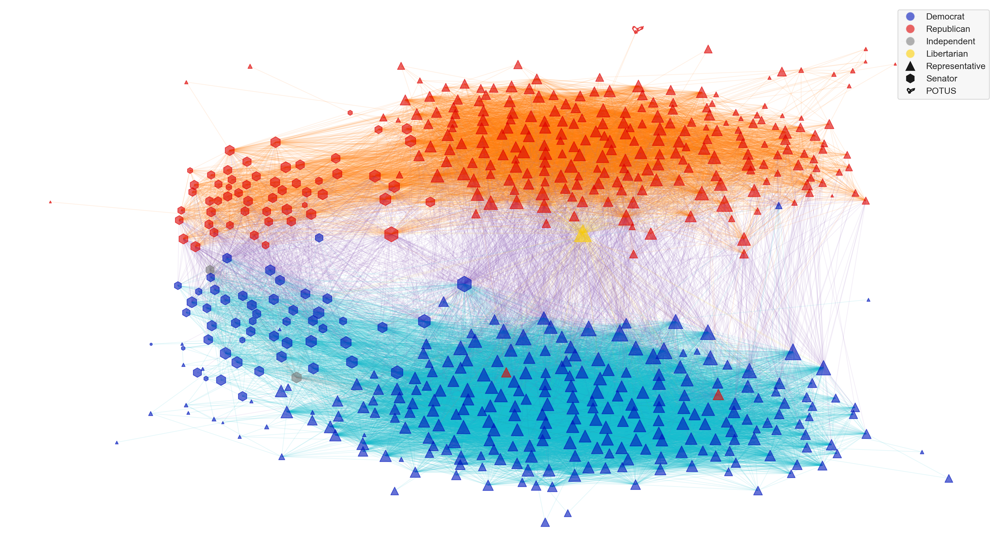

In [212]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=False,  # Dissuade hubs
    edgeWeightInfluence = 0.5, # Performance

    # Performance
    jitterTolerance=0.2,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=0.6,

    # Tuning
    scalingRatio=5.0,
    gravity=1.0,

    # Log
    verbose=True
)

# Initialize
plt.figure(figsize=(24,13.5), dpi = 240)

# Calculate positions
positions = forceatlas2.forceatlas2_networkx_layout(UG, pos=None, iterations=1000)


# Draw graph
for i, node in enumerate(UG.nodes):
    nx.draw_networkx_nodes(
        G = UG,
        pos = positions,
        nodelist = [node],
        node_size = node_size[i],
        node_shape = node_shape[i],
        node_color = node_color[i],
        alpha=0.6
    )

nx.draw_networkx_edges(
    G = UG,
    pos = positions,
    edge_color = edge_colors,
    alpha=0.1
)

# Legend
legend_elements = [Line2D([0], [0], marker='o', color='#F5F5F5', label=Party,
                          markerfacecolor=col, markersize=12, alpha=0.6) for Party, col in color_dict.items()]+\
                   [Line2D([0], [0], marker=Marker, color='k', label=Type,
                          markerfacecolor="k", linewidth=0, markersize=12, alpha=1) for Type, Marker in shape_dict.items()]+\
                              
plt.legend(handles = legend_elements, facecolor = "#F5F5F5", loc=0, fontsize = 12)


# Show and save
plt.axis('off')
plt.savefig('../figures/Follow_graph.jpg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

In [220]:
[Line2D([0], [0], marker=Marker, color='k', label=Type,
                          markerfacecolor="k", linewidth=0, markersize=12, alpha=1) for Type, Marker in shape_dict.items()]
                            

{'#FED105', 'tab:cyan', 'tab:gray', 'tab:orange', 'tab:purple'}

In [217]:
pd.Series(edge_colors).value_counts()

tab:cyan      13550
tab:orange     8924
tab:purple     2089
#FED105         196
tab:gray        123
dtype: int64

In [213]:
# Send data
nx.write_gpickle(G_U, '../models/follow_graph.pickle')

# Community Detection